# Customer Churn Prediction at Orange 
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Orange_logo.svg/1022px-Orange_logo.svg.png" width="9%">


**Author**: Pawel Cislo <pawel.cisloo@gmail.com>

**Steps to reproduce**:

1.   Import libraries
2.   Load data files
3.   Data preprocessing
4.   Exploratory data analysis (EDA)
5.   Data visualisation
6.   Model building
7.   Model performances
8.   List of churning customers

# Step 1: Import libraries

In [1]:
# Import initial libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as po
import plotly.graph_objs as go
%matplotlib inline

# Step 2: Load data files

In [2]:
# Load customer data files
training_data = pd.read_csv('/data/orange_train.csv')
testing_data = pd.read_csv('/data/orange_score.csv')

# Step 3: Data preprocessing

## Removing duplicate rows

In [3]:
# Check if there are any duplicate primary_key values
isDuplicated = training_data['primary_key'].duplicated().any()
print("Are there any duplicated values in the training data?\n",isDuplicated) # It turns out that the primary_key "41654" is duplicated 1000 times

isDuplicated = testing_data['primary_key'].duplicated().any()
print("Are there any duplicated values in the testing data?\n",isDuplicated) # There are no duplicated primary_key values in the testing_data

Are there any duplicated values in the training data?
 True
Are there any duplicated values in the testing data?
 False


In [4]:
# Remove duplicate primary_key rows in the training_data
training_data.drop_duplicates(subset ="primary_key", 
                     keep = 'first', inplace = True)

In [5]:
# Check if there are duplicate primary_keys in training and testing set merged
merged_datasets = training_data.merge(testing_data, on="primary_key")
isDuplicated = merged_datasets['primary_key'].duplicated().any()
print("Are there any duplicated values in the merged datasets?\n",isDuplicated) # The result is False (there are no duplicate primary_key values)

Are there any duplicated values in the merged datasets?
 False


## Removing negative rows

In [6]:
# Drop all rows with negative values in both sets
training_data = training_data[training_data.select_dtypes(include=[np.number]).ge(0).all(1)]
testing_data = testing_data[testing_data.select_dtypes(include=[np.number]).ge(0).all(1)]

# Step 4: Exploratory data analysis

In [7]:
# Display 5 first rows of training and testing data
training_data.head()

,primary_key,r_age_val,cust_gender_cd,cust_language_cd,cust_mkt_segm_desc,trf_mdl_phonedeal_cd,count_orange,cust_total_mobile_qty,voice_oob_mean,voice_oob_sum,voice_oob_nat_mean,voice_oob_nat_sum,mean_bill_rev_vs_trf_plan,tenure_days,days_since_moving,nb_cont,avg_tp_churn,churned
0,1,0.369409,F,FR,MASS,0,0,1,0.000000,0.0000,0.000000,0.0000,0.826445,228,365,24,0.036341,0
1,2,0.160948,M,FR,MASS,0,0,1,16.338333,49.0150,16.338333,49.0150,0.000000,2715,365,19,0.025139,0
2,3,0.495127,F,FR,MASS,0,0,1,0.000000,0.0000,0.000000,0.0000,0.835336,6211,365,16,0.036596,0
3,4,0.227484,M,FR,MASS,1,0,2,0.000000,0.0000,0.000000,0.0000,0.827435,152,365,15,0.024090,0
4,5,0.213877,F,NL,MASS,0,0,1,1.349567,4.0487,1.349567,4.0487,0.986898,3896,365,15,0.035460,0


In [8]:
testing_data.head()

,primary_key,r_age_val,cust_gender_cd,cust_language_cd,cust_mkt_segm_desc,trf_mdl_phonedeal_cd,count_orange,cust_total_mobile_qty,voice_oob_mean,voice_oob_sum,voice_oob_nat_mean,voice_oob_nat_sum,mean_bill_rev_vs_trf_plan,tenure_days,days_since_moving,nb_cont,avg_tp_churn
0,100001,0.713838,F,NL,MASS,1,0,3,0.0000,0.0000,0.0,0.0,0.826447,6024,365,51,0.012574
1,100002,0.419197,F,FR,MASS,1,0,1,0.0000,0.0000,0.0,0.0,1.074080,5536,365,59,0.012574
2,100003,0.886683,F,NL,MASS,0,0,2,0.0000,0.0000,0.0,0.0,0.921540,6804,365,20,0.020130
3,100004,0.123176,M,NL,MASS,0,0,1,6.8458,20.5374,0.0,0.0,1.034490,7424,365,79,0.029747
4,100005,0.550202,M,FR,MASS,1,0,1,0.0000,0.0000,0.0,0.0,0.669156,879,365,45,0.006520


In [9]:
# Check number of columns and rows in the training and testing data
training_data.shape # (100000, 18)

(99958, 18)

In [10]:
testing_data.shape # (10000, 17)

(9991, 17)

In [11]:
# Count null values in the training and testing data
training_data.isnull().sum()

primary_key                  0
r_age_val                    0
cust_gender_cd               0
cust_language_cd             0
cust_mkt_segm_desc           0
trf_mdl_phonedeal_cd         0
count_orange                 0
cust_total_mobile_qty        0
voice_oob_mean               0
voice_oob_sum                0
voice_oob_nat_mean           0
voice_oob_nat_sum            0
mean_bill_rev_vs_trf_plan    0
tenure_days                  0
days_since_moving            0
nb_cont                      0
avg_tp_churn                 0
churned                      0
dtype: int64

In [12]:
testing_data.isnull().sum() # there are no null values in both sets

primary_key                  0
r_age_val                    0
cust_gender_cd               0
cust_language_cd             0
cust_mkt_segm_desc           0
trf_mdl_phonedeal_cd         0
count_orange                 0
cust_total_mobile_qty        0
voice_oob_mean               0
voice_oob_sum                0
voice_oob_nat_mean           0
voice_oob_nat_sum            0
mean_bill_rev_vs_trf_plan    0
tenure_days                  0
days_since_moving            0
nb_cont                      0
avg_tp_churn                 0
dtype: int64

In [13]:
# Count number of "Unknown" values in the "cust_gender_cd" field for the training data
training_data['cust_gender_cd'].value_counts() # in numbers

F          50154
M          45738
Unknown     4066
Name: cust_gender_cd, dtype: int64

In [14]:
training_data['cust_gender_cd'].value_counts(normalize=True) #in percentage (F 50%, M 46%, Unknown 4%)

F          0.501751
M          0.457572
Unknown    0.040677
Name: cust_gender_cd, dtype: float64

In [15]:
# Count number of "Unknown" values in the "cust_gender_cd" field for the testing data
testing_data['cust_gender_cd'].value_counts(normalize=True) #in percentage (F 50%, M 46%, Unknown 4%)

F          0.498248
M          0.456411
Unknown    0.045341
Name: cust_gender_cd, dtype: float64

In [16]:
# Extensive profiling report of training data using pandas_profiling function. It provides much more information than the classical df.describe() function

# the commented line below doesn't work any longer in Google Colab
# pandas_profiling.ProfileReport(training_data)doesn't work any longer in Google Colab

# therefore, we will install the working version of Pandas Profiling in Google Colab
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.10.0-py2.py3-none-any.whl size=239950 sha256=d5db74f301b4a8643d1fba36399de3c93ad5ab10f2fb7adeec2439bbab2b55e9
  Stored in directory: /tmp/pip-ephem-wheel-cache-188fh13b/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [17]:
from pandas_profiling import ProfileReport

In [18]:
# Generate Pandas Profiling report
profile = ProfileReport(training_data)
profile.to_notebook_iframe() #profile.to_widgets() isn't working properly yet in Google Colab

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
# Save Pandas Profiling report in HTML format
profile.to_file(output_file="/results/pandas_profiling_report.html") 

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

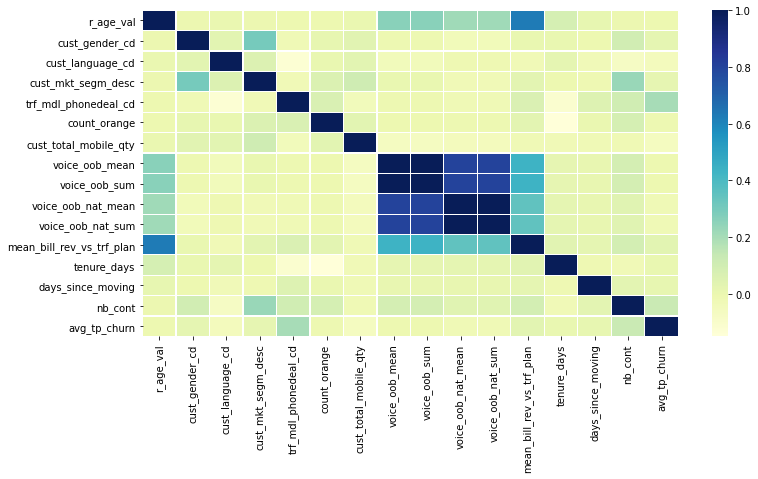

In [20]:
# Generate correlation heatmap between features
training_data_for_correlation = training_data.copy()
plt.figure(figsize=(12, 6))
training_data_for_correlation.drop(['primary_key', 'churned'],
        axis=1, inplace=True)
corr = training_data_for_correlation.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
                 linewidths=.2, cmap="YlGnBu")

**NOTE**: Overall both datasets are clean and quite normalised; therefore, they should not require any manipulation.
The only concern may be raised by the `Unknown` value of the `cust_gender_cd` field, which is only 4% of all the values.

# Step 5: Data visualisation

## Categorical graphs

In [21]:
# Visualise total customer churn (using Plotly)
plot_by_churn_values = training_data["churned"].value_counts().values.tolist()

plot_data= [
    go.Pie(labels = ["Existing customer","Churned"],
           values = plot_by_churn_values,
           marker = dict(colors =  [ 'rgb(247, 151, 39)' ,'rgb(102, 102, 102)'],
                         line = dict(color = "white",
                                     width =  1.5)),
           rotation = 90,
           hoverinfo = "label+value+text",
           hole = .6)
]
plot_layout = go.Layout(dict(title = "100k Customer Churn Comparison",
                   plot_bgcolor  = "rgb(234, 232, 232)",
                   paper_bgcolor = "rgb(234, 232, 232)",
                   autosize=False, 
                   width=500,
                   height=500))

fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig) # churning customers = 2.2%

In [22]:
# Visualize Churn Rate by Gender
plot_by_gender = training_data.groupby('cust_gender_cd').churned.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_gender['cust_gender_cd'],
        y=plot_by_gender['churned'],
        text=plot_by_gender['churned'],
        texttemplate='%{value:.3f}',
        textposition='outside',
        width = [0.3, 0.3],
        marker=dict(
        color=['rgb(251, 179, 103)', 'rgb(247, 151, 39)', 'rgb(239, 179, 119)'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category", "title": "Gender", "categoryorder":"total descending"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Gender',
        plot_bgcolor  = 'rgb(234, 232, 232)',
        paper_bgcolor  = 'rgb(234, 232, 232)',
        autosize=False, 
        width=500,
        height=500
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [23]:
# Visualize Churn Rate by customer language
plot_by_gender = training_data.groupby('cust_language_cd').churned.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_gender['cust_language_cd'],
        y=plot_by_gender['churned'],
        text=plot_by_gender['churned'],
        texttemplate='%{value:.3f}',
        textposition='outside',
        width = [0.3, 0.3],
        marker=dict(
        color=['rgb(251, 179, 103)', 'rgb(247, 151, 39)', 'rgb(239, 179, 119)', 'rgb(255, 136, 0)'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category", "title": "Language", "categoryorder":"total descending"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Customer Language',
        plot_bgcolor  = 'rgb(234, 232, 232)',
        paper_bgcolor  = 'rgb(234, 232, 232)',
        autosize=False, 
        width=500,
        height=500
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [24]:
# Visualize Churn Rate by customer market segment
plot_by_gender = training_data.groupby('cust_mkt_segm_desc').churned.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_gender['cust_mkt_segm_desc'],
        y=plot_by_gender['churned'],
        text=plot_by_gender['churned'],
        texttemplate='%{value:.3f}',
        textposition='outside',
        width = [0.3, 0.3],
        marker=dict(
        color=['rgb(251, 179, 103)', 'rgb(247, 151, 39)'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category", "title": "Market Segment", "categoryorder":"total descending"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Market Segment',
        plot_bgcolor  = 'rgb(234, 232, 232)',
        paper_bgcolor  = 'rgb(234, 232, 232)',
        autosize=False, 
        width=500,
        height=500
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [25]:
# Visualize Churn Rate by trf_mdl_phonedeal_cd
plot_by_gender = training_data.groupby('trf_mdl_phonedeal_cd').churned.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_gender['trf_mdl_phonedeal_cd'],
        y=plot_by_gender['churned'],
        text=plot_by_gender['churned'],
        texttemplate='%{value:.3f}',
        textposition='outside',
        width = [0.3, 0.3],
        marker=dict(
        color=['rgb(251, 179, 103)', 'rgb(247, 151, 39)'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category", "title": "trf_mdl_phonedeal_cd", "categoryorder":"total descending"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by trf_mdl_phonedeal_cd',
        plot_bgcolor  = 'rgb(234, 232, 232)',
        paper_bgcolor  = 'rgb(234, 232, 232)',
        autosize=False, 
        width=500,
        height=500
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [26]:
# Visualize Churn Rate by count_orange
plot_by_gender = training_data.groupby('count_orange').churned.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_gender['count_orange'],
        y=plot_by_gender['churned'],
        text=plot_by_gender['churned'],
        texttemplate='%{value:.3f}',
        textposition='outside',
        width = [0.3, 0.3],
        marker=dict(
        color=['rgb(251, 179, 103)', 'rgb(247, 151, 39)', 'rgb(239, 179, 119)', 'rgb(255, 136, 0)', 'rgb(173, 96, 8)', 'rgb(224, 146, 58)', 'rgb(219, 179, 133)'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category", "title": "count_orange", "categoryorder":"total descending"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by count_orange',
        plot_bgcolor  = 'rgb(234, 232, 232)',
        paper_bgcolor  = 'rgb(234, 232, 232)',
        autosize=False, 
        width=800,
        height=500
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

## Scatter plots

In [27]:
# Visualize Relation between mean_bill_rev_vs_trf_plan & churn rate
plot_by_tenure = training_data.groupby('mean_bill_rev_vs_trf_plan').churned.mean().reset_index()
plot_data = [
    go.Scatter(
        x=plot_by_tenure['mean_bill_rev_vs_trf_plan'],
        y=plot_by_tenure['churned'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=0.8),
            color= 'rgb(234, 129, 9)'
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "mean_bill_rev_vs_trf_plan"},
        title='Relation between mean_bill_rev_vs_trf_plan & churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [28]:
# Visualize Relation between nb_cont & churn rate
plot_by_tenure = training_data.groupby('nb_cont').churned.mean().reset_index()
plot_data = [
    go.Scatter(
        x=plot_by_tenure['nb_cont'],
        y=plot_by_tenure['churned'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=0.8),
            color= 'rgb(234, 129, 9)'
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "nb_cont"},
        title='Relation between nb_cont & churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [29]:
# Visualize Relation between nb_cont & churn rate
plot_by_tenure = training_data.groupby('avg_tp_churn').churned.mean().reset_index()
plot_data = [
    go.Scatter(
        x=plot_by_tenure['avg_tp_churn'],
        y=plot_by_tenure['churned'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=0.8),
            color= 'rgb(234, 129, 9)'
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "avg_tp_churn"},
        title='Relation between avg_tp_churn & Churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

# Step 6: Model building

## Data preprocessing (part 2)

In [30]:
# Perform One Hot Encoding on categorical & boolean values using get_dummies method
training_data = pd.get_dummies(training_data, columns = ['cust_gender_cd','cust_language_cd','cust_mkt_segm_desc',
                                                         'trf_mdl_phonedeal_cd'
                                                        ],
                              drop_first=True)

testing_data = pd.get_dummies(testing_data, columns = ['cust_gender_cd','cust_language_cd','cust_mkt_segm_desc',
                                                         'trf_mdl_phonedeal_cd'
                                                        ],
                              drop_first=True)

In [31]:
# Perform Feature Scaling
## If we use a data without feature scaling we might not get optimised predictions
from sklearn.preprocessing import StandardScaler

# Perform Feature Scaling on several columns in order to bring them on the same scale
standardScaler = StandardScaler()
columns_for_ft_scaling = ['r_age_val','voice_oob_mean', 'voice_oob_sum', 
                          'voice_oob_nat_mean', 'voice_oob_nat_sum',
                          'mean_bill_rev_vs_trf_plan', 'tenure_days',
                          'days_since_moving', 'nb_cont','avg_tp_churn']

# Apply the feature scaling operation on dataset using fit_transform() method
training_data[columns_for_ft_scaling] = standardScaler.fit_transform(training_data[columns_for_ft_scaling])
testing_data[columns_for_ft_scaling] = standardScaler.fit_transform(testing_data[columns_for_ft_scaling])

In [32]:
# See sample rows after the normalisation
training_data.head()

,primary_key,r_age_val,count_orange,cust_total_mobile_qty,voice_oob_mean,voice_oob_sum,voice_oob_nat_mean,voice_oob_nat_sum,mean_bill_rev_vs_trf_plan,tenure_days,days_since_moving,nb_cont,avg_tp_churn,churned,cust_gender_cd_M,cust_gender_cd_Unknown,cust_language_cd_EN,cust_language_cd_FR,cust_language_cd_NL,cust_mkt_segm_desc_SOHO,trf_mdl_phonedeal_cd_1
0,1,-0.447276,0,1,-0.278894,-0.279634,-0.242911,-0.242997,-0.423606,-1.166828,0.16971,-0.504822,0.816480,0,0,0,0,1,0,0,0
1,2,-1.168752,0,1,2.303998,2.323236,3.407881,3.416319,-1.692265,0.046348,0.16971,-0.621783,-0.415077,0,1,0,0,1,0,0,0
2,3,-0.012170,0,1,-0.278894,-0.279634,-0.242911,-0.242997,-0.409959,1.751721,0.16971,-0.691959,0.844416,0,0,0,0,1,0,0,0
3,4,-0.938475,0,2,-0.278894,-0.279634,-0.242911,-0.242997,-0.422087,-1.203901,0.16971,-0.715351,-0.530470,0,1,0,0,1,0,0,1
4,5,-0.985568,0,1,-0.065544,-0.064634,0.058649,0.059267,-0.177298,0.622448,0.16971,-0.715351,0.719568,0,0,0,0,0,1,0,0


In [33]:
# Number of columns increased and have suffixes attached, as a result of get_dummies method
training_data.columns

Index(['primary_key', 'r_age_val', 'count_orange', 'cust_total_mobile_qty',
       'voice_oob_mean', 'voice_oob_sum', 'voice_oob_nat_mean',
       'voice_oob_nat_sum', 'mean_bill_rev_vs_trf_plan', 'tenure_days',
       'days_since_moving', 'nb_cont', 'avg_tp_churn', 'churned',
       'cust_gender_cd_M', 'cust_gender_cd_Unknown', 'cust_language_cd_EN',
       'cust_language_cd_FR', 'cust_language_cd_NL', 'cust_mkt_segm_desc_SOHO',
       'trf_mdl_phonedeal_cd_1'],
      dtype='object')

##  Machine Learning

In [34]:
# Create feature variable X and target variable y
y = training_data['churned']
X = training_data.drop(['churned','primary_key'], axis = 1)

In [35]:
# Split the data into training set (70%) and test set (30%)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 50)

In [36]:
# Import Machine Learning classification model libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import classification_report,confusion_matrix
from sklearn import metrics # this library is used for evaluating the ML models

In [37]:
# Fit the logistic Regression Model
logmodel = LogisticRegression(random_state=50, max_iter=200)
logmodel.fit(X_train,y_train)

# Predict the value for new, unseen data
pred = logmodel.predict(X_test)

# Find Accuracy using accuracy_score method
logmodel_accuracy = round(metrics.accuracy_score(y_test, pred) * 100, 2)
print("The accuracy of the Logistic Regression model is: ",logmodel_accuracy) # around 97.84%

The accuracy of the Logistic Regression model is:  97.84


In [38]:
# Fit the Support Vector Machine Model
svcmodel = SVC(kernel='linear', random_state=50, probability=True)
svcmodel.fit(X_train,y_train)

# Predict the value for new, unseen data
svc_pred = svcmodel.predict(X_test)

# Find Accuracy using accuracy_score method
svc_accuracy = round(metrics.accuracy_score(y_test, svc_pred) * 100, 2)
print("The accuracy of the Support Vector Machine model is: ",svc_accuracy) # around 97.85%

The accuracy of the Support Vector Machine model is:  97.85


In [39]:
# Fit the K-Nearest Neighbor Model
from sklearn.neighbors import KNeighborsClassifier
knnmodel = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2) #p=2 represents Euclidean distance, p=1 represents Manhattan Distance
knnmodel.fit(X_train, y_train)

# Predict the value for new, unseen data
knn_pred = knnmodel.predict(X_test)

# Find Accuracy using accuracy_score method
knn_accuracy = round(metrics.accuracy_score(y_test, knn_pred) * 100, 2)
print("The accuracy of the K-Nearest Neighbor model is: ",knn_accuracy) # around 97.83%

The accuracy of the K-Nearest Neighbor model is:  97.83


In [40]:
# Fit the Decision Tree Classification Model
from sklearn.tree import DecisionTreeClassifier
dtmodel = DecisionTreeClassifier(criterion = "gini", random_state = 50)
dtmodel.fit(X_train, y_train)
  
# Predict the value for new, unseen data
dt_pred = dtmodel.predict(X_test)

# Find Accuracy using accuracy_score method
dt_accuracy = round(metrics.accuracy_score(y_test, dt_pred) * 100, 2)
print("The accuracy of the Decision Tree Classification model is: ",dt_accuracy) # around 95.4%

The accuracy of the Decision Tree Classification model is:  95.4


In [41]:
# Fit the Random Forest Classification Model
from sklearn.ensemble import RandomForestClassifier
rfmodel = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfmodel.fit(X_train, y_train) 
  
# Predict the value for new, unseen data
rf_pred = rfmodel.predict(X_test)

# Find Accuracy using accuracy_score method
rf_accuracy = round(metrics.accuracy_score(y_test, rf_pred) * 100, 2)
print("The accuracy of the Random Forest Classification model is: ",rf_accuracy) # around 97.85%

The accuracy of the Random Forest Classification model is:  97.85


### XGBoost Classifier

In [42]:
# Fit the XGBoost Classifier
xgb_model = xgb.XGBClassifier(max_depth=5, learning_rate=0.08, objective= 'binary:logistic',n_jobs=-1).fit(X_train, y_train)
xgb_accuracy = round(xgb_model.score(X_train, y_train) * 100, 2)

print("The accuracy of the XGBoost Classifier is: ",xgb_accuracy) # around 97.78%

The accuracy of the XGBoost Classifier is:  97.78


In [43]:
# Check our classification model to see where exactly our model fails
y_pred = xgb_model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     29343
           1       0.00      0.00      0.00       645

    accuracy                           0.98     29988
   macro avg       0.49      0.50      0.49     29988
weighted avg       0.96      0.98      0.97     29988



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



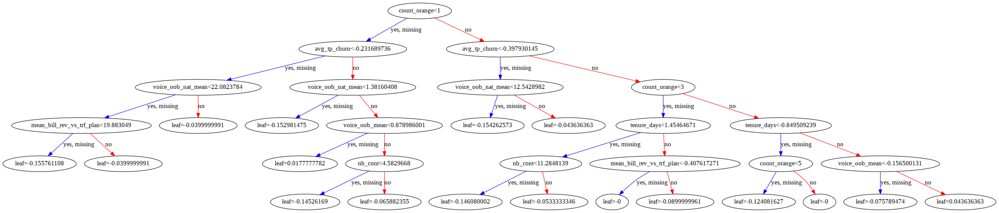

In [44]:
# Visualize Gradient Boosting Decision Tree with XGBoost
from xgboost import plot_tree
from xgboost import plot_importance

fig, ax = plt.subplots(figsize=(100,100))
plot_tree(xgb_model, ax=ax)

In [45]:
# Convert the raw score for class 1 (leaf value) to a probability score by using the logistic function
leaf_value = -0.155761108 # <--- replace this value to find other probabilities
1/(1+np.exp(leaf_value)) 

0.5388617383398366

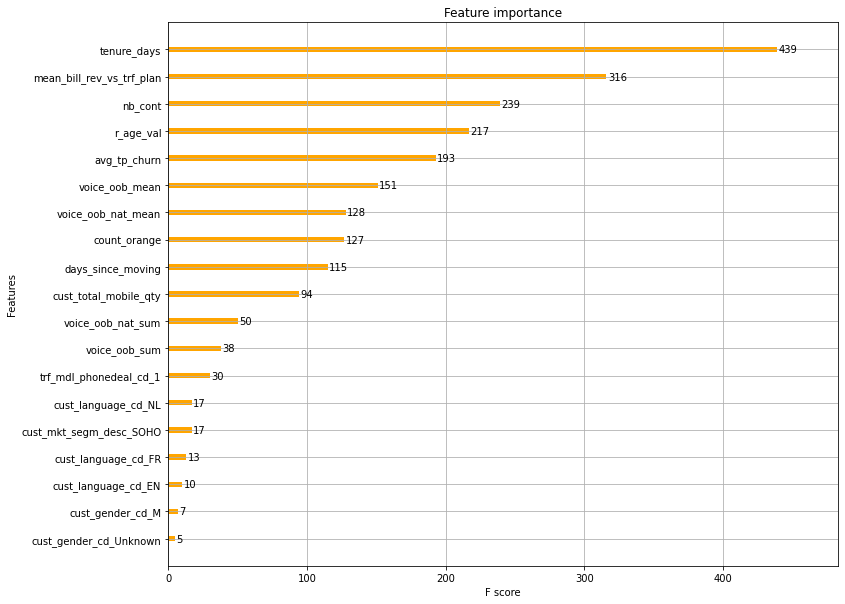

In [46]:
# Find the most important features
fig, ax = plt.subplots(figsize=(12,10))
plot_importance(xgb_model, ax=ax, color = "orange")

# Step 7: Model performances

In [47]:
# Compare Several models according to their accuracies
Model_Comparison = pd.DataFrame({
    'Model': ['Logistic Regression', 'Support Vector Machine', 'K-Nearest Neighbor', 
              'Decision Tree', 'Random Forest', 'XGBoost Classifier'],
    'Score': [logmodel_accuracy, svc_accuracy, knn_accuracy, 
              dt_accuracy, rf_accuracy, xgb_accuracy]})
Model_Comparison_df = Model_Comparison.sort_values(by='Score', ascending=False)
Model_Comparison_df = Model_Comparison_df.set_index('Score')
Model_Comparison_df.reset_index()

,Score,Model
0,97.85,Support Vector Machine
1,97.85,Random Forest
2,97.84,Logistic Regression
3,97.83,K-Nearest Neighbor
4,97.78,XGBoost Classifier
5,95.40,Decision Tree


In [48]:
# Generate confusion matrix for logistics regression model as it has one of the highest accuracies
from sklearn.metrics import confusion_matrix
conf_mat_logmodel = confusion_matrix(y_test,pred)
conf_mat_logmodel # (29340 + 0 = 29340 correct predictions) & (645 + 3 = 648 incorrect predictions)

array([[29340,     3],
       [  645,     0]])

# Step 8: List of churning customers in the testing data

In [49]:
# Predict the probability of Churn of each customer
testing_data['Probability_of_Churn'] = logmodel.predict_proba(testing_data[X_test.columns])[:,1]

In [50]:
# Create a Dataframe showcasing probability of Churn of each customer
probability_results = testing_data[['primary_key','Probability_of_Churn']]

In [51]:
# Save the results to a CSV file
probability_results.to_csv(r'/results/probabilities.csv', index = False, header=True)